In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
import seaborn as sns
import time
from pyxlsb import open_workbook as open_xlsb

In [2]:
import pandas as pd
import numpy as np
np.random.seed(0)
import statsmodels as sm
import matplotlib.pyplot as plt
% matplotlib inline
import sklearn as skl
import sklearn.preprocessing as preprocessing
import sklearn.linear_model as linear_model
from sklearn.cross_validation import train_test_split
import sklearn.metrics as metrics
import sklearn.tree as tree
import seaborn as sns
import graphviz 
from sklearn.tree import export_graphviz
from pyxlsb import open_workbook as open_xlsb

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [83]:
import itertools

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix

from imblearn.over_sampling import SMOTE, ADASYN
from sklearn import preprocessing

In [3]:
df = []

with open_xlsb('zenith_claims.xlsb') as wb:
    with wb.get_sheet(1) as sheet:
        for row in sheet.rows():
            df.append([item.v for item in row])

df = pd.DataFrame(df[1:], columns=df[0])

In [4]:
df

,Branch,Department,Class,Product,Source Type Code,Customer code,Broker cd,IS there endorsement,Corporate/Not,ISSUE MONTH,...,DISCOUNT_FLAG,LOADING_FLAG,SI EXPOSURE,Broker_Comm_Flag,Total Premium,Incurred,Claim Flag,Business Type,Status,CRM
0,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,10.0,...,0.0,0.0,1,1.0,20000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-09810 - OKENKWA SIMEONE
1,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,10.0,...,0.0,0.0,2,1.0,344000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-09810 - OKENKWA SIMEONE
2,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,C,6.0,...,0.0,0.0,2,1.0,280000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
3,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,C,1.0,...,0.0,0.0,1,1.0,140000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-02002 - MRS JOYCE ODIACHI
4,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,1.0,DI,0,YES,NoC,3.0,...,1.0,0.0,1,0.0,45000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-21155 - VIVIAN AWELE CHUKWUEDO
5,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,6.0,...,1.0,0.0,1,1.0,141000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
6,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DC,SA,YES,C,4.0,...,1.0,0.0,1,1.0,175000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
7,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,1.0,DI,0,YES,NoC,5.0,...,1.0,0.0,1,0.0,75000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
8,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,NoC,8.0,...,1.0,0.0,1,1.0,190000.00,0.00,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
9,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,1.0,DI,0,YES,C,5.0,...,0.0,0.0,1,0.0,25000.00,91800.00,1.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM


In [5]:
df.describe()

,Source Type Code,ISSUE MONTH,POLICY_START_MONTH,APPROVAL MONTH,DISCOUNT_FLAG,LOADING_FLAG,Broker_Comm_Flag,Total Premium,Incurred,Claim Flag
count,120235.000000,120235.000000,120235.000000,120235.000000,120235.000000,120235.000000,120235.000000,1.202350e+05,1.202350e+05,120235.000000
mean,2.215328,6.067027,6.142188,6.178143,0.038857,0.009473,0.834990,5.532110e+05,2.176536e+05,0.060099
std,0.682923,3.444750,3.470242,3.391381,0.193255,0.096868,0.371191,9.495032e+06,1.052451e+07,0.237671
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-1.162174e+09,0.000000e+00,0.000000
25%,2.000000,3.000000,3.000000,3.000000,0.000000,0.000000,1.000000,1.499278e+04,0.000000e+00,0.000000
50%,2.000000,6.000000,6.000000,6.000000,0.000000,0.000000,1.000000,5.832125e+04,0.000000e+00,0.000000
75%,3.000000,9.000000,9.000000,9.000000,0.000000,0.000000,1.000000,2.025000e+05,0.000000e+00,0.000000
max,3.000000,12.000000,12.000000,12.000000,1.000000,1.000000,1.000000,1.162174e+09,2.841673e+09,1.000000


In [6]:
df.columns

Index(['Branch', 'Department', 'Class', 'Product', 'Source Type Code',
       'Customer code', 'Broker cd', 'IS there endorsement', 'Corporate/Not',
       'ISSUE MONTH', 'ISSUE_END_DURATION', 'POLICY_START_MONTH', 'TERM_DESC',
       'APPROVAL MONTH', 'DISCOUNT_FLAG', 'LOADING_FLAG', 'SI EXPOSURE',
       'Broker_Comm_Flag', 'Total Premium', 'Incurred', 'Claim Flag',
       'Business Type', 'Status', 'CRM'],
      dtype='object')

In [7]:
df.shape

(120235, 24)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120235 entries, 0 to 120234
Data columns (total 24 columns):
Branch                  120235 non-null object
Department              120235 non-null object
Class                   120235 non-null object
Product                 120235 non-null object
Source Type Code        120235 non-null float64
Customer code           120235 non-null object
Broker cd               120235 non-null object
IS there endorsement    120235 non-null object
Corporate/Not           120235 non-null object
ISSUE MONTH             120235 non-null float64
ISSUE_END_DURATION      120235 non-null object
POLICY_START_MONTH      120235 non-null float64
TERM_DESC               120235 non-null object
APPROVAL MONTH          120235 non-null float64
DISCOUNT_FLAG           120235 non-null float64
LOADING_FLAG            120235 non-null float64
SI EXPOSURE             120235 non-null object
Broker_Comm_Flag        120235 non-null float64
Total Premium           120235 non-n

In [9]:
df.isna().sum()

Branch                   0
Department               0
Class                    0
Product                  0
Source Type Code         0
Customer code            0
Broker cd                0
IS there endorsement     0
Corporate/Not            0
ISSUE MONTH              0
ISSUE_END_DURATION       0
POLICY_START_MONTH       0
TERM_DESC                0
APPROVAL MONTH           0
DISCOUNT_FLAG            0
LOADING_FLAG             0
SI EXPOSURE              0
Broker_Comm_Flag         0
Total Premium            0
Incurred                 0
Claim Flag               0
Business Type            1
Status                   1
CRM                     49
dtype: int64

In [10]:
#Since there are only 51 records with null values we can afford to delete them from the dataset
claims = df.dropna()

In [11]:
claims.isna().sum()

Branch                  0
Department              0
Class                   0
Product                 0
Source Type Code        0
Customer code           0
Broker cd               0
IS there endorsement    0
Corporate/Not           0
ISSUE MONTH             0
ISSUE_END_DURATION      0
POLICY_START_MONTH      0
TERM_DESC               0
APPROVAL MONTH          0
DISCOUNT_FLAG           0
LOADING_FLAG            0
SI EXPOSURE             0
Broker_Comm_Flag        0
Total Premium           0
Incurred                0
Claim Flag              0
Business Type           0
Status                  0
CRM                     0
dtype: int64

In [12]:
df.head()

,Branch,Department,Class,Product,Source Type Code,Customer code,Broker cd,IS there endorsement,Corporate/Not,ISSUE MONTH,...,DISCOUNT_FLAG,LOADING_FLAG,SI EXPOSURE,Broker_Comm_Flag,Total Premium,Incurred,Claim Flag,Business Type,Status,CRM
0,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,10.0,...,0.0,0.0,1,1.0,20000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-09810 - OKENKWA SIMEONE
1,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,10.0,...,0.0,0.0,2,1.0,344000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-09810 - OKENKWA SIMEONE
2,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,C,6.0,...,0.0,0.0,2,1.0,280000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
3,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,C,1.0,...,0.0,0.0,1,1.0,140000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-02002 - MRS JOYCE ODIACHI
4,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,1.0,DI,0,YES,NoC,3.0,...,1.0,0.0,1,0.0,45000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-21155 - VIVIAN AWELE CHUKWUEDO


In [13]:
pd.set_option('display.max_columns', None)

In [21]:
#check for correlations between variables
claims_corr = claims.corr()
claims_corr

,Source Type Code,ISSUE MONTH,POLICY_START_MONTH,APPROVAL MONTH,DISCOUNT_FLAG,LOADING_FLAG,Broker_Comm_Flag,Total Premium,Incurred,Claim Flag
Source Type Code,1.000000,0.014407,-0.027317,-0.000702,-0.036127,0.020463,0.691833,-0.004789,0.002324,0.047689
ISSUE MONTH,0.014407,1.000000,0.737587,0.750297,-0.028609,-0.000964,0.046066,-0.010260,-0.008501,-0.041466
POLICY_START_MONTH,-0.027317,0.737587,1.000000,0.786062,-0.027717,-0.001608,-0.006097,-0.013112,-0.010834,-0.077034
APPROVAL MONTH,-0.000702,0.750297,0.786062,1.000000,-0.029012,-0.005166,0.022684,-0.012889,-0.009794,-0.076233
DISCOUNT_FLAG,-0.036127,-0.028609,-0.027717,-0.029012,1.000000,0.106506,-0.022404,-0.003272,0.000552,0.039694
LOADING_FLAG,0.020463,-0.000964,-0.001608,-0.005166,0.106506,1.000000,0.021730,0.002484,-0.000544,0.037770
Broker_Comm_Flag,0.691833,0.046066,-0.006097,0.022684,-0.022404,0.021730,1.000000,-0.007350,-0.000011,0.004609
Total Premium,-0.004789,-0.010260,-0.013112,-0.012889,-0.003272,0.002484,-0.007350,1.000000,0.136317,0.049608
Incurred,0.002324,-0.008501,-0.010834,-0.009794,0.000552,-0.000544,-0.000011,0.136317,1.000000,0.081793
Claim Flag,0.047689,-0.041466,-0.077034,-0.076233,0.039694,0.037770,0.004609,0.049608,0.081793,1.000000


The features ISSUE MONTH, POLICY_START_MONTH and APPROVAL MONTH are all highly correlated. As such I have dropped ISSUE MONTH and POLICY_START_MONTH from the dataset as including them will lead to dilution of weights once the model has been trained.

In [22]:
claims_df = claims.drop(columns = ['ISSUE MONTH', 'POLICY_START_MONTH'])
claims_df.head(5)

,Branch,Department,Class,Product,Source Type Code,Customer code,Broker cd,IS there endorsement,Corporate/Not,ISSUE_END_DURATION,TERM_DESC,APPROVAL MONTH,DISCOUNT_FLAG,LOADING_FLAG,SI EXPOSURE,Broker_Comm_Flag,Total Premium,Incurred,Claim Flag,Business Type,Status,CRM
0,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,0,FULL,11.0,0.0,0.0,1,1.0,20000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-09810 - OKENKWA SIMEONE
1,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,3.0,BR,BR,YES,C,1,FULL,11.0,0.0,0.0,2,1.0,344000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-09810 - OKENKWA SIMEONE
2,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,C,0,FULL,6.0,0.0,0.0,2,1.0,280000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-01978 - MRS NKIRU NNOROM
3,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,2.0,DI,SA,YES,C,1,FULL,1.0,0.0,0.0,1,1.0,140000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-02002 - MRS JOYCE ODIACHI
4,HEAD OFFICE,Motor,Private Motor,Private Motor - Comprehensive,1.0,DI,0,YES,NoC,0,FULL,5.0,1.0,0.0,1,0.0,45000.0,0.0,0.0,Direct,Renewal endorsment,CRM-1-21155 - VIVIAN AWELE CHUKWUEDO


In [23]:
claims_df['Claim Flag'].value_counts()

0.0    112961
1.0      7224
Name: Claim Flag, dtype: int64

In [24]:
claims_df['DISCOUNT_FLAG'].value_counts()

0.0    115513
1.0      4672
Name: DISCOUNT_FLAG, dtype: int64

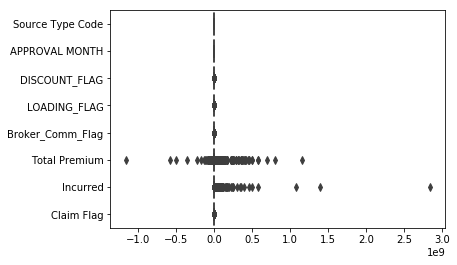

In [25]:
ax = sns.boxplot(data = claims_df, orient = "h", color = "violet", palette = "Set1")
plt.show()

In [59]:
#Separate numerical columns from categorical columns to enable one_hot_encoding
num_col = claims_df.select_dtypes(include=np.number).columns
num_col

Index(['Source Type Code', 'APPROVAL MONTH', 'DISCOUNT_FLAG', 'LOADING_FLAG',
       'Broker_Comm_Flag', 'Total Premium', 'Incurred', 'Claim Flag'],
      dtype='object')

In [60]:
num_col.drop(['Source Type Code','APPROVAL MONTH', 'DISCOUNT_FLAG', 'LOADING_FLAG', 'Broker_Comm_Flag'])

Index(['Total Premium', 'Incurred', 'Claim Flag'], dtype='object')

In [61]:
#Get categorical columns
cat_col = claims_df.select_dtypes(exclude=np.number).columns
cat_col

Index(['Branch', 'Department', 'Class', 'Product', 'Customer code',
       'Broker cd', 'IS there endorsement', 'Corporate/Not',
       'ISSUE_END_DURATION', 'TERM_DESC', 'SI EXPOSURE', 'Business Type',
       'Status', 'CRM'],
      dtype='object')

In [62]:
#one hot encoding 
encoded_cat_col = pd.get_dummies(claims_df[cat_col])
encoded_cat_col

Branch_ABA  Branch_ABUJA 1  Branch_AGENCY  Branch_AGENCY ANNEX 1  \
0                0               0              0                      0   
1                0               0              0                      0   
2                0               0              0                      0   
3                0               0              0                      0   
4                0               0              0                      0   
5                0               0              0                      0   
6                0               0              0                      0   
7                0               0              0                      0   
8                0               0              0                      0   
9                0               0              0                      0   
10               0               0              0                      0   
11               0               0              0                      0   
12               0               0              0                      0   
13               0               0              0                      0   
14               0               0              0                      0   
15               0               0              0                      0   
16               0               0              0                      0   
17               0               0              0                      0   
18               0               0              0                      0   
19               0               0              0                      0   
20               0               0              0                      0   
21               0               0              0                      0   
22               0               0              0                      0   
23               0               0              0                      0   
24               0               0              0                      0   
25               0               0              0                      0   
26               0               0              0                      0   
27               0               0              0                      0   
28               0               0              0                      0   
29               0               0              0                      0   
...            ...             ...            ...                    ...   
120205           0               0              0                      0   
120206           0               0              0                      0   
120207           0               0              0                      0   
120208           0               0              0                      0   
120209           0               0              0                      0   
120210           0               0              0                      0   
120211           0               0              0                      0   
120212           0               0              0                      0   
120213           0               0              0                      0   
120214           0               0              0                      0   
120215           0               0              0                      0   
120216           0               0              0                      0   
120217           0               0              0                      0   
120218           0               0              0                      0   
120219           0               0              0                      0   
120220           0               0              0                      0   
120221           0               0              0                      0   
120222           0               0              0                      0   
120223           0               0              0                      0   
120224           0               0              0                      0   
120225           0               0              0       

The features 'APPROVAL MONTH', 'DISCOUNT_FLAG', 'LOADING_FLAG' and 'Broker_Comm_Flag' are categorical features even though they are represented using numerical values. As such they must be one-hot-encoded as well.

In [63]:
new_cat_features = claims_df[['Source Type Code','APPROVAL MONTH', 'DISCOUNT_FLAG', 'LOADING_FLAG','Broker_Comm_Flag']]

In [64]:
#change feature data type from float64 to object data type
new_cat_features = new_cat_features.astype(object)

In [65]:
dummies = pd.get_dummies(new_cat_features)

In [66]:
claims_df_encoded = pd.concat([claims_df[['Total Premium', 'Incurred', 'Claim Flag']],encoded_cat_col,dummies], axis=1)
claims_df_encoded

Total Premium    Incurred  Claim Flag  Branch_ABA  Branch_ABUJA 1  \
0            20000.00        0.00         0.0           0               0   
1           344000.00        0.00         0.0           0               0   
2           280000.00        0.00         0.0           0               0   
3           140000.00        0.00         0.0           0               0   
4            45000.00        0.00         0.0           0               0   
5           141000.00        0.00         0.0           0               0   
6           175000.00        0.00         0.0           0               0   
7            75000.00        0.00         0.0           0               0   
8           190000.00        0.00         0.0           0               0   
9            25000.00    91800.00         1.0           0               0   
10           19014.10  9806320.05         1.0           0               0   
11            7119.70        0.00         0.0           0               0   
12            2306.50        0.00         0.0           0               0   
13         4555719.00        0.00         0.0           0               0   
14           35340.41        0.00         0.0           0               0   
15          647718.75        0.00         0.0           0               0   
16           18000.00        0.00         0.0           0               0   
17           60000.00        0.00         0.0           0               0   
18          110000.00   321550.00         1.0           0               0   
19          110000.00        0.00         0.0           0               0   
20          100000.00        0.00         0.0           0               0   
21          200000.00        0.00         0.0           0               0   
22          265354.54        0.00         0.0           0               0   
23          237526.03        0.00         0.0           0               0   
24           30000.00        0.00         0.0           0               0   
25           54877.50        0.00         0.0           0               0   
26           17100.00        0.00         0.0           0               0   
27           52500.00        0.00         0.0           0               0   
28          119700.00        0.00         0.0           0               0   
29           68400.00        0.00         0.0           0               0   
...               ...         ...         ...         ...             ...   
120205      228000.00        0.00         0.0           0               0   
120206      100000.00        0.00         0.0           0               0   
120207       64000.00        0.00         0.0           0               0   
120208       23477.50        0.00         0.0           0               0   
120209       44372.50        0.00         0.0           0               0   
120210       29750.00   170000.00         1.0           0               0   
120211      175000.00        0.00         0.0           0               0   
120212       52500.00        0.00         0.0           0               0   
120213       52500.00        0.00         0.0           0               0   
120214       87500.00        0.00         0.0           0               0   
120215       87500.00        0.00         0.0           0               0   
120216       30000.00        0.00         0.0           0               0   
120217       31500.00        0.00         0.0           0               0   
120218      145800.00        0.00         0.0           0               0   
120219       67500.00        0.00         0.0           0               0   
120220       64000.00        0.00         0.0           0               0   
120221        5000.00        0.00         0.0           0               0   
120222        5000.00        0.00         0.0           0               0   
120223        5000.00        0.00         0.0           0               0   
120224        5000.00        0.00         0.0           0               0   
1202

Now that we have performed the necessary data preperation tasks, we can move into the modeling stage of the project. The target variable here is the feature Claim Flag. I am going to isolate that variable as my Y vector. All other features will be my X matrix. I will then split them into my training, testing, and validation groups and proceed with fitting the models. 

In [68]:
y = claims_df_encoded['Claim Flag']

In [69]:
y.value_counts()

0.0    112961
1.0      7224
Name: Claim Flag, dtype: int64

From the above you can see that there is clearly a class imbalance issue as the outcome '1' represents only 6.4% of the total classifications of Claim Flags. If we use this data representation as is the model will not be trained properly to identify claims with a value of '1'. The model might still achieve a very high degree of accuracy by simply predicting all zeros but will have a very low recall value. We need the model to accurately predict claims that will be made (i.e. predict a value of 1 when that in fact is the case). I will be using the SMOTE method (Synthetic Minority Oversampling Technique). This creates synthetic data that is biased towards the monority class (in this case the '1') thereby giving the model more data to learn the peculiarities of said minority class.

In [75]:
claims_df_encoded.drop('Claim Flag', axis = 1, inplace = True)

In [77]:
X = claims_df_encoded

In [85]:
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X_normalized = pd.DataFrame(np_scaled, columns = X.columns)
X_normalized

Total Premium  Incurred  Branch_ABA  Branch_ABUJA 1  Branch_AGENCY  \
0            0.500009  0.000000         0.0             0.0            0.0   
1            0.500148  0.000000         0.0             0.0            0.0   
2            0.500120  0.000000         0.0             0.0            0.0   
3            0.500060  0.000000         0.0             0.0            0.0   
4            0.500019  0.000000         0.0             0.0            0.0   
5            0.500061  0.000000         0.0             0.0            0.0   
6            0.500075  0.000000         0.0             0.0            0.0   
7            0.500032  0.000000         0.0             0.0            0.0   
8            0.500082  0.000000         0.0             0.0            0.0   
9            0.500011  0.000032         0.0             0.0            0.0   
10           0.500008  0.003451         0.0             0.0            0.0   
11           0.500003  0.000000         0.0             0.0            0.0   
12           0.500001  0.000000         0.0             0.0            0.0   
13           0.501960  0.000000         0.0             0.0            0.0   
14           0.500015  0.000000         0.0             0.0            0.0   
15           0.500279  0.000000         0.0             0.0            0.0   
16           0.500008  0.000000         0.0             0.0            0.0   
17           0.500026  0.000000         0.0             0.0            0.0   
18           0.500047  0.000113         0.0             0.0            0.0   
19           0.500047  0.000000         0.0             0.0            0.0   
20           0.500043  0.000000         0.0             0.0            0.0   
21           0.500086  0.000000         0.0             0.0            0.0   
22           0.500114  0.000000         0.0             0.0            0.0   
23           0.500102  0.000000         0.0             0.0            0.0   
24           0.500013  0.000000         0.0             0.0            0.0   
25           0.500024  0.000000         0.0             0.0            0.0   
26           0.500007  0.000000         0.0             0.0            0.0   
27           0.500023  0.000000         0.0             0.0            0.0   
28           0.500051  0.000000         0.0             0.0            0.0   
29           0.500029  0.000000         0.0             0.0            0.0   
...               ...       ...         ...             ...            ...   
120155       0.500098  0.000000         0.0             0.0            0.0   
120156       0.500043  0.000000         0.0             0.0            0.0   
120157       0.500028  0.000000         0.0             0.0            0.0   
120158       0.500010  0.000000         0.0             0.0            0.0   
120159       0.500019  0.000000         0.0             0.0            0.0   
120160       0.500013  0.000060         0.0             0.0            0.0   
120161       0.500075  0.000000         0.0             0.0            0.0   
120162       0.500023  0.000000         0.0             0.0            0.0   
120163       0.500023  0.000000         0.0             0.0            0.0   
120164       0.500038  0.000000         0.0             0.0            0.0   
120165       0.500038  0.000000         0.0             0.0            0.0   
120166       0.500013  0.000000         0.0             0.0            0.0   
120167       0.500014  0.000000         0.0             0.0            0.0   
120168       0.500063  0.000000         0.0             0.0            0.0   
120169       0.500029  0.000000         0.0             0.0            0.0   
120170       0.500028  0.000000         0.0             0.0            0.0   
120171       0.500002  0.000000         0.0             0.0            0.0   
120172       0.500002  0.000000         0.0             0.0            0.0   
120173       0.500002  0.000000         0.0             0.0            0.0   
120174       0.500002  0.00000

In [86]:
#Split dataset into training set and testing set
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y, random_state=0)

In [87]:
print(y_train.value_counts())
print(y_test.value_counts())

0.0    84695
1.0     5443
Name: Claim Flag, dtype: int64
0.0    28266
1.0     1781
Name: Claim Flag, dtype: int64


As a baseline, I'll fit a cookie cutter out of the box logistic regression model. Then plot the ROC curve and print out the AUC. We'll use this as a comparison for how our future models perform.

AUC: 0.8332965447801512


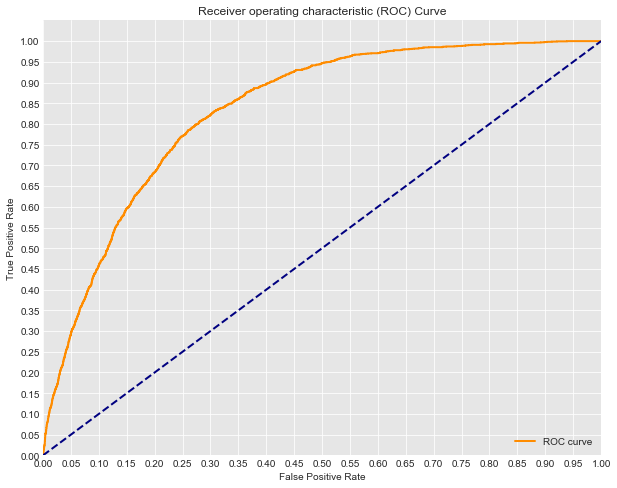

In [88]:
#Initial Model
logreg = LogisticRegression(fit_intercept = False)

#Probability scores for test set
y_score = logreg.fit(X_train, y_train).decision_function(X_test)
#False positive Rate and true positive rate
fpr, tpr, thresholds = roc_curve(y_test, y_score)

#Seaborns Beautiful Styling
sns.set_style("darkgrid", {"axes.facecolor": ".9"})

print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10,8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

## Plot Confusion Matrix

In [89]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    #Add Normalization Option
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[28222  1753]
 [   44    28]]


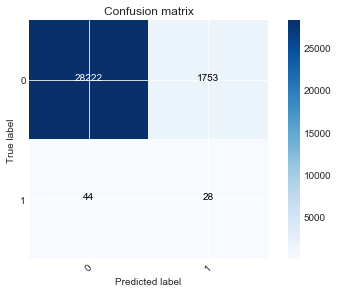

In [90]:
y_hat_test = logreg.predict(X_test)
cnf_matrix = confusion_matrix(y_hat_test, y_test)
plot_confusion_matrix(cnf_matrix, classes=[0,1])

## Tune Model Using Available parameters

LogisticRegression(C=0.001, class_weight=None, dual=False,
          fit_intercept=False, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)
AUC for 0.001: 0.78739386591796
LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
AUC for 0.01: 0.8217594796970292
LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
AUC for 0.1: 0.8314545149069722
LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=False,
          intercept_scalin

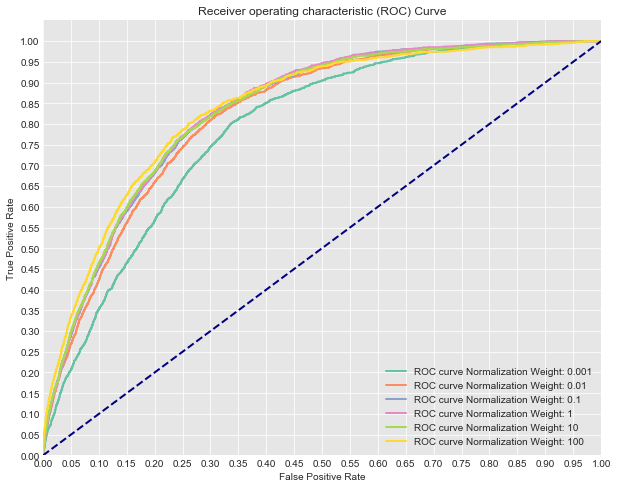

In [91]:
C_param_range = [0.001,0.01,0.1,1,10,100]
names = [0.001,0.01,0.1,1,10,100]
colors = sns.color_palette("Set2")

plt.figure(figsize=(10,8))

for n, c in enumerate(C_param_range):
    #Fit a model
    logreg = LogisticRegression(fit_intercept = False, C = c) #Starter code
    model_log = logreg.fit(X_train, y_train)
    print(model_log) #Preview model params

    #Predict
    y_hat_test = logreg.predict(X_test)

    y_score = logreg.fit(X_train, y_train).decision_function(X_test)

    fpr, tpr, thresholds = roc_curve(y_test, y_score)
    
    print('AUC for {}: {}'.format(names[n], auc(fpr, tpr)))
    lw = 2
    plt.plot(fpr, tpr, color=colors[n],
             lw=lw, label='ROC curve Normalization Weight: {}'.format(names[n]))
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

The Highest AUC so far has been 0.8378. Let's introduce SMOTE to see how this affects performance

# SMOTE

In [92]:
print(y_train.value_counts()) #Previous original class distribution
X_train_resampled, y_train_resampled = SMOTE().fit_sample(X_train, y_train) 
print(pd.Series(y_train_resampled).value_counts()) #Preview synthetic sample class distribution

0.0    84695
1.0     5443
Name: Claim Flag, dtype: int64
1.0    84695
0.0    84695
dtype: int64


LogisticRegression(C=20, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
AUC for 20: 0.8316823576202541
LogisticRegression(C=40, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
AUC for 40: 0.834494675651496
LogisticRegression(C=80, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
AUC for 80: 0.8365095839147096
LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=False,
          intercept_scaling=1, max_

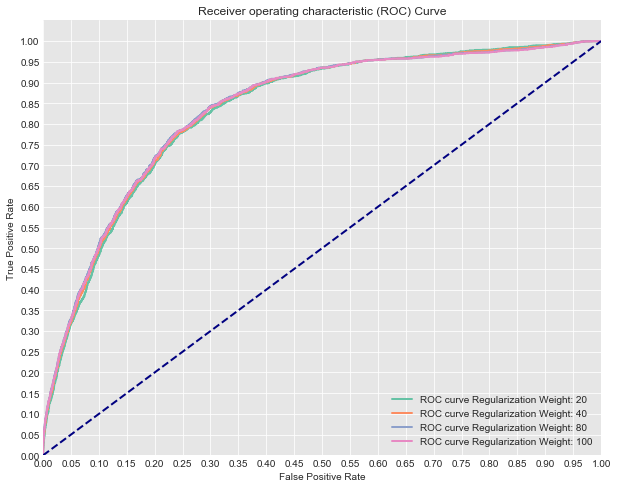

In [96]:
# Now let's compare a few different regularization performances on the dataset:
C_param_range = [20, 40, 80, 100]
names = [20, 40, 80, 100]
colors = sns.color_palette("Set2", n_colors=len(names))

plt.figure(figsize=(10,8))

for n, c in enumerate(C_param_range):
    #Fit a model
    logreg = LogisticRegression(fit_intercept = False, C = c) #Starter code
    model_log = logreg.fit(X_train_resampled, y_train_resampled)
    print(model_log) #Preview model params

    #Predict
    y_hat_test = logreg.predict(X_test)

    y_score = logreg.fit(X_train_resampled, y_train_resampled).decision_function(X_test)

    fpr, tpr, thresholds = roc_curve(y_test, y_score)
    
    print('AUC for {}: {}'.format(names[n], auc(fpr, tpr)))
    lw = 2
    plt.plot(fpr, tpr, color=colors[n],
             lw=lw, label='ROC curve Regularization Weight: {}'.format(names[n]))
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Confusion matrix, without normalization
[[21118   377]
 [ 7148  1404]]


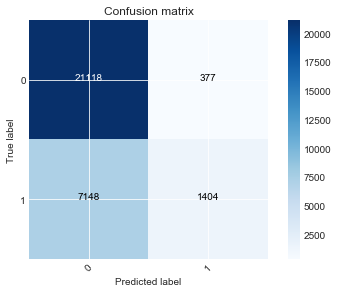

In [97]:
cnf_matrix = confusion_matrix(y_hat_test, y_test)
plot_confusion_matrix(cnf_matrix, classes=[0,1])

There has been no significant improvement in AUC. Next steps include trying other oversampling techniques, trying other models like Random Forrest. I haven't included more complex models like the ensemble models and SVCs because even though they are more effective models, their explainability is quite low.